In [1]:
import sys
sys.path.append('../')
%load_ext autoreload
%autoreload 3

import xarray as xr
import matplotlib.pyplot as plt
from helpers.computational_tools import *
import xesmf as xe
import gsw
from dask.diagnostics import ProgressBar

from helpers.compute_APE import compute_APE, compute_mask
from helpers.collection_of_experiments import CollectionOfExperiments

# Initialize OM4 data

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

(3.5e+20, 4e+20)

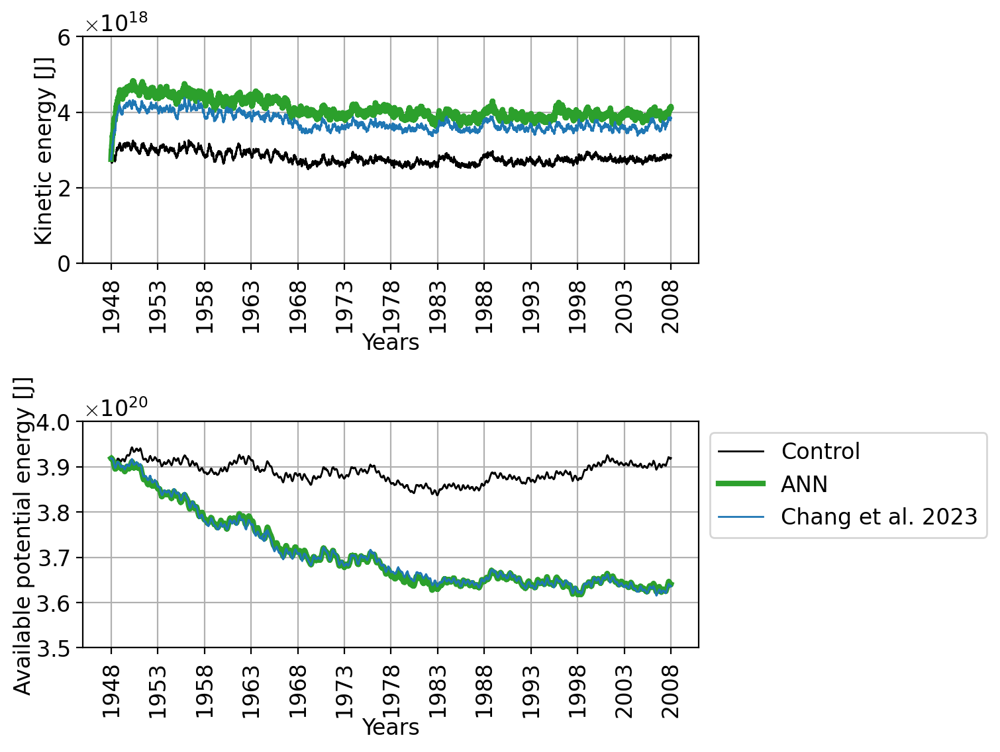

In [8]:
ds.plot_series(['unparameterized', 'ANN', 'MEKE-Chang'], CFL=False, 
               colors=['k', 'tab:green', 'tab:blue'], 
               labels=['Control', 'ANN', 'Chang et al. 2023'],
               lws=[1,3,1])
for j in range(2):
    plt.subplot(2,1,j+1)
    plt.xticks(np.array([0,5,10,15,20,25,30,35,40,45,50,55,60])*365, 1948 + np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), rotation=90)

plt.ylim([3.5e+20, 4e+20])

(3.5e+20, 4e+20)

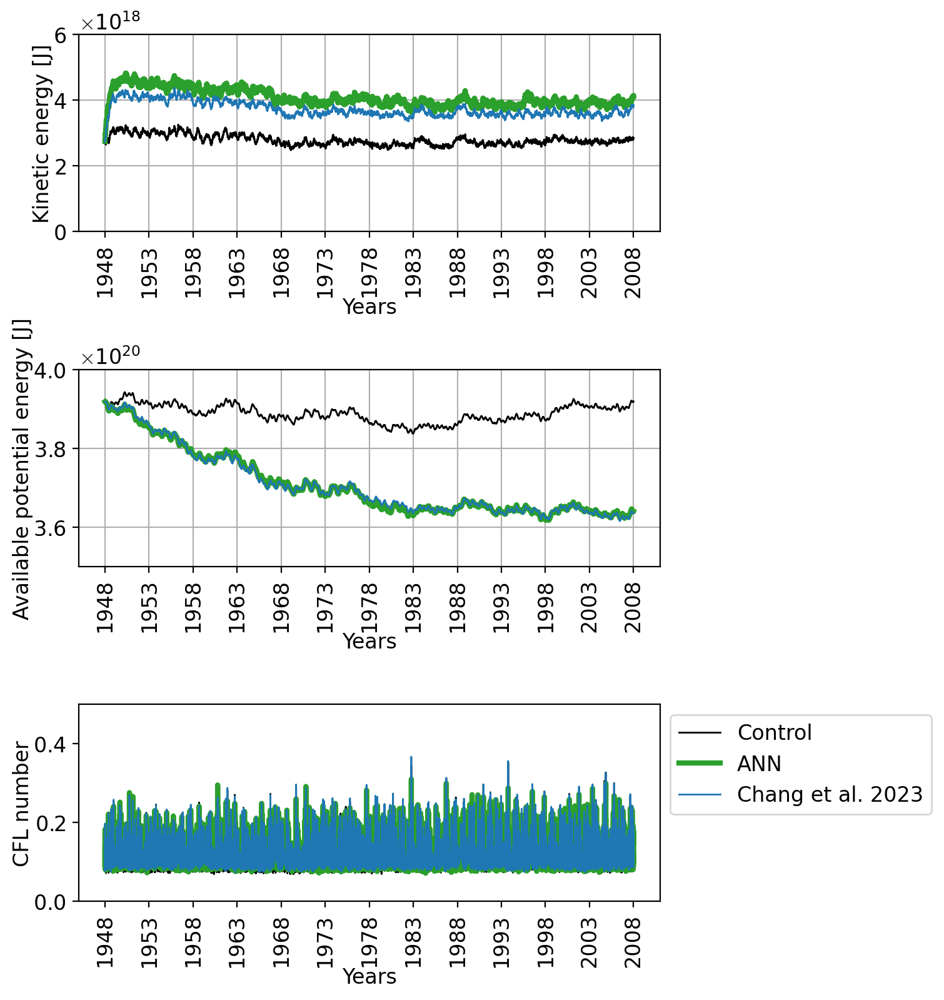

In [3]:
ds.plot_series(['unparameterized', 'ANN', 'MEKE-Chang'], CFL=True, 
               colors=['k', 'tab:green', 'tab:blue'], 
               labels=['Control', 'ANN', 'Chang et al. 2023'],
               lws=[1,3,1])
for j in range(3):
    plt.subplot(3,1,j+1)
    plt.xticks(np.array([0,5,10,15,20,25,30,35,40,45,50,55,60])*365, 1948 + np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), rotation=90)

plt.subplot(3,1,2)
plt.ylim([3.5e+20, 4e+20])

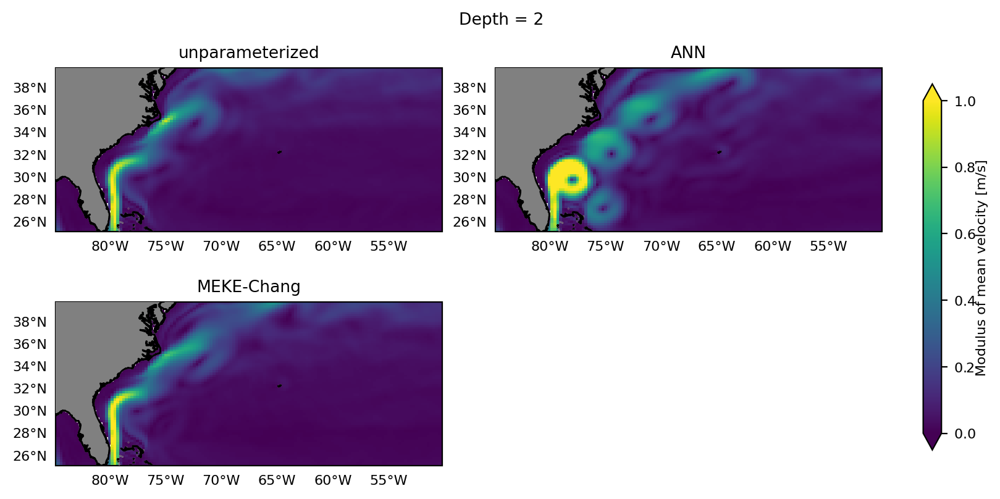

In [6]:
ds.plot_uabs(['unparameterized', 'ANN', 'MEKE-Chang'], select=select_NA_Florida)

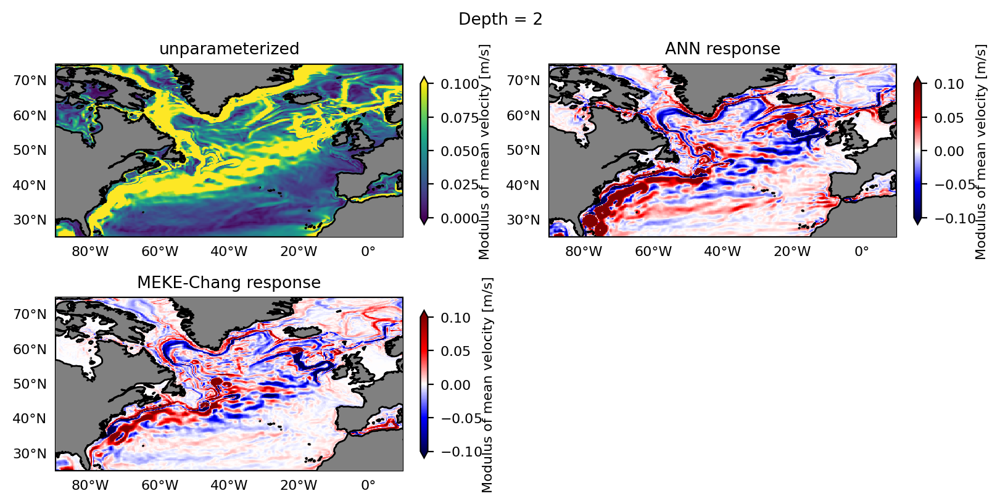

In [14]:
ds.plot_uabs(['unparameterized', 'ANN', 'MEKE-Chang'], select=select_NA_Marzocchi, zl=0, plot_type='response', vmax=0.1)

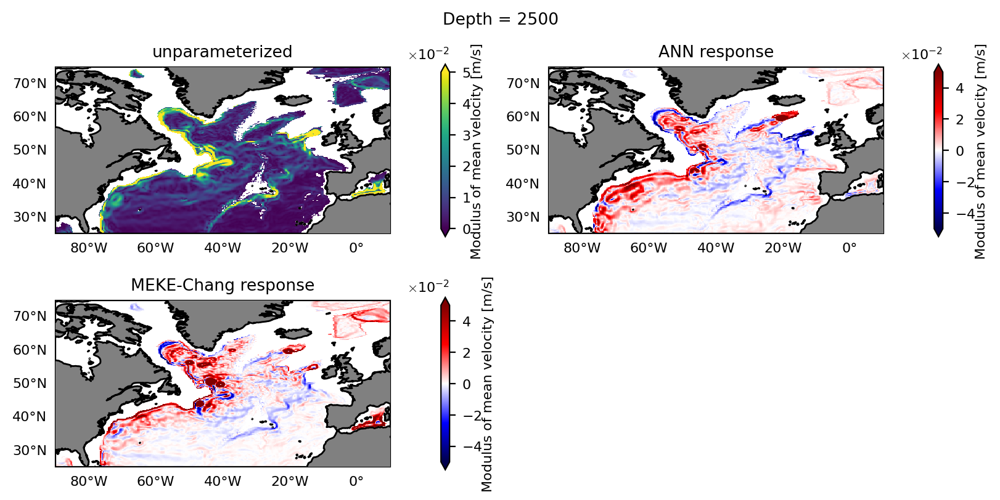

In [12]:
ds.plot_uabs(['unparameterized', 'ANN', 'MEKE-Chang'], select=select_NA_Marzocchi, zl=26, plot_type='response', vmax=0.05)

In [ ]:
# Drake, Temperature
# AMOC profile, MLD
# SO overturning
# Heat flux

# Speed at Depth

In [9]:
param = ds['unparameterized'].param
dz = ds['unparameterized'].dz
mask_nan = xr.where(np.isnan(ds['MEKE-Chang'].ocean_annual_z.thetao.isel(time=0)), np.nan, 1.).compute()
dV = mask_nan * param.areacello * dz

In [10]:
def ave(x):
    return (x * dV).sum(['zl','xh','yh']) / dV.sum(['zl', 'xh', 'yh'])

In [11]:
with ProgressBar():
    thetao_MEKE = ave(ds['MEKE-Chang'].ocean_annual_z.thetao).compute()
    thetao_ctrl = ave(ds['unparameterized'].ocean_annual_z.thetao).compute()
    thetao_ann = ave(ds['ANN'].ocean_annual_z.thetao).compute()

[########################################] | 100% Completed | 21.15 s
[########################################] | 100% Completed | 2.33 sms
[########################################] | 100% Completed | 20.84 s
[########################################] | 100% Completed | 2.02 sms
[########################################] | 100% Completed | 21.15 s


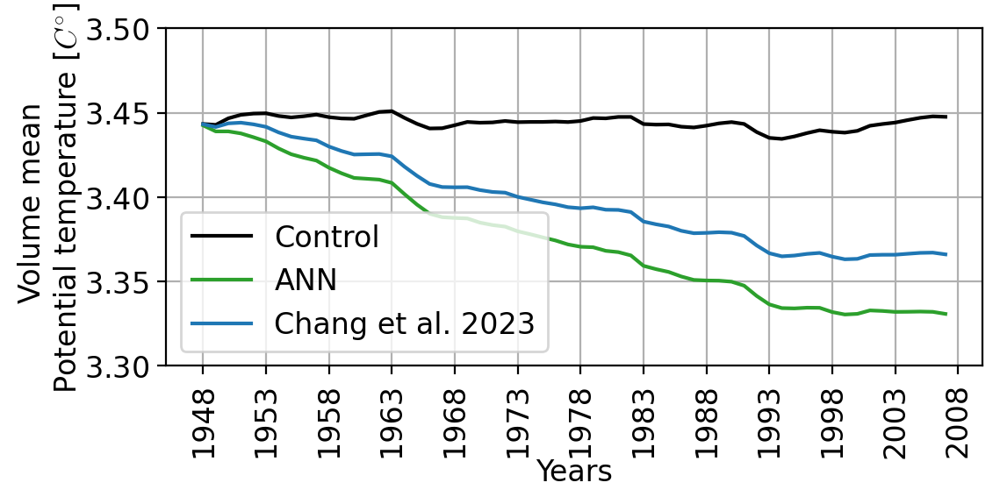

In [12]:
plt.figure(figsize=(6,2.5), dpi=200)
thetao_ctrl.drop_vars('time').plot(color='k', label='Control')
thetao_ann.drop_vars('time').plot(color='tab:green', label='ANN')
thetao_MEKE.drop_vars('time').plot(color='tab:blue', label='Chang et al. 2023');
plt.xticks(np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), 1948 + np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), rotation=90);
plt.xlabel('Years')
plt.ylabel('Volume mean \nPotential temperature [$C^{\circ}$]')
plt.grid()
plt.ylim([3.3,3.5])
plt.legend()

# SST bias

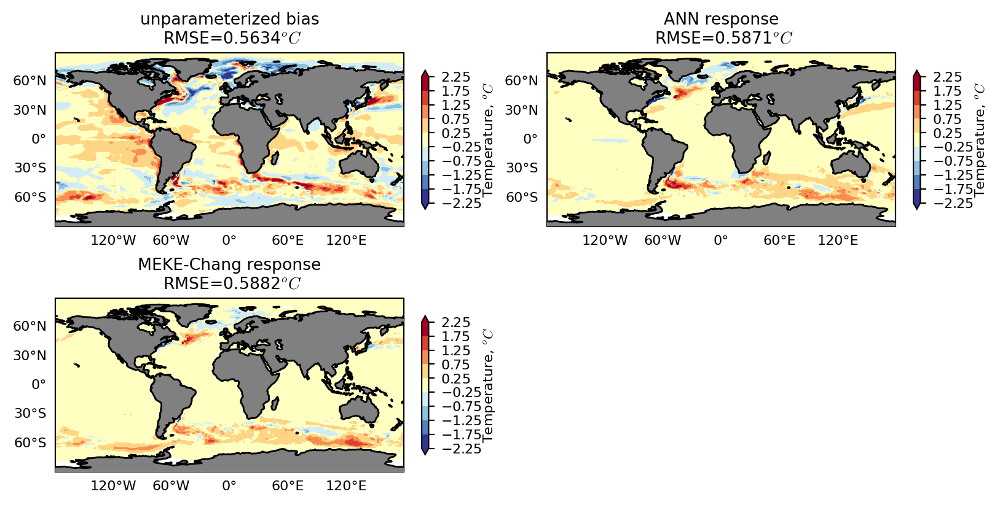

In [30]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response')

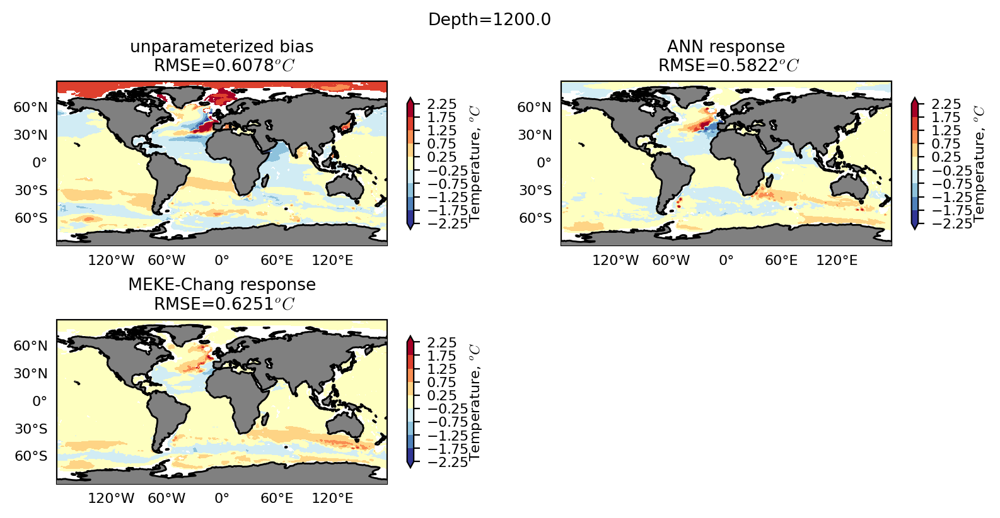

In [31]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=20)

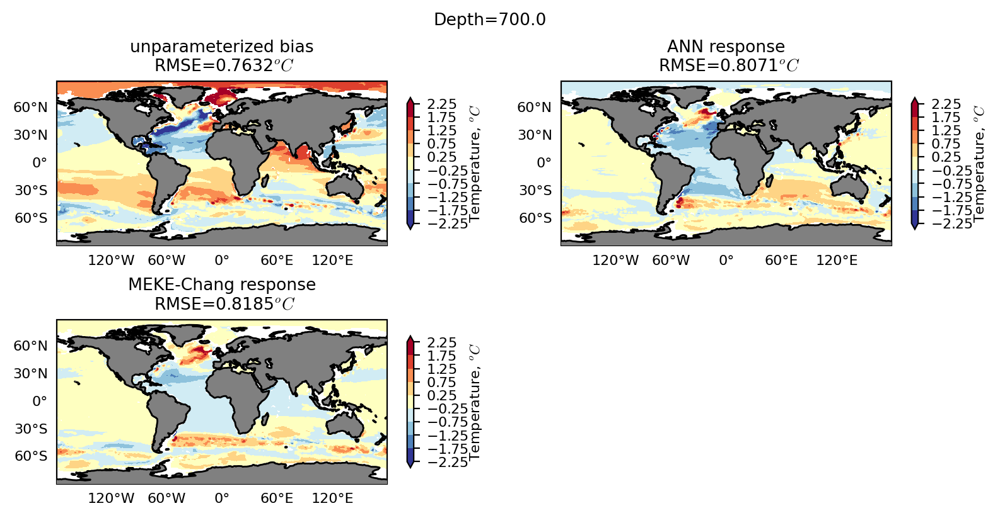

In [33]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=15)

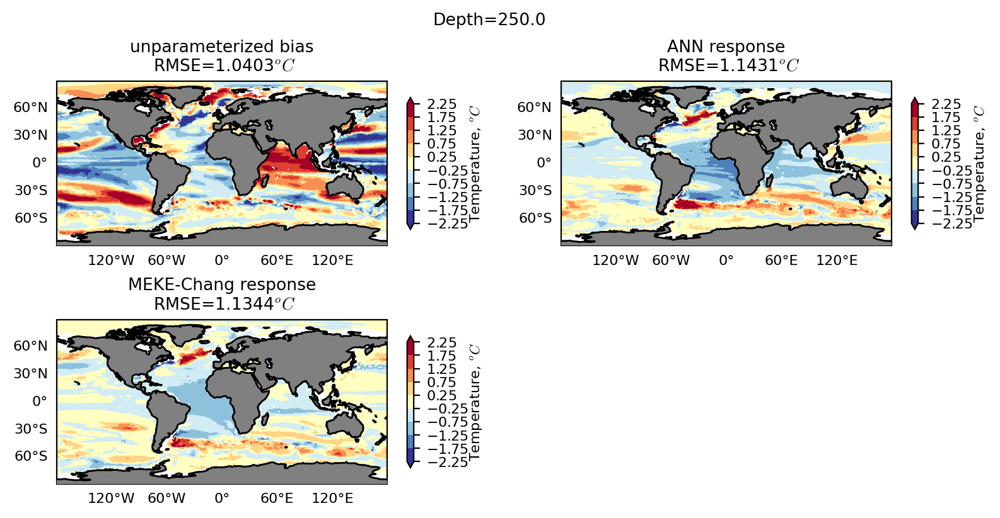

In [32]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10)

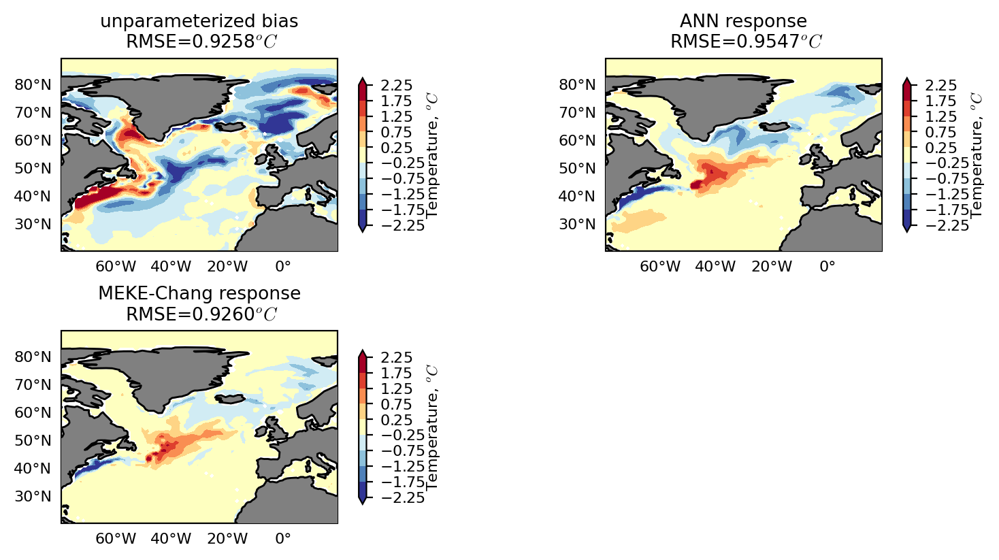

In [36]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=0, select=select_NA_Jenny)

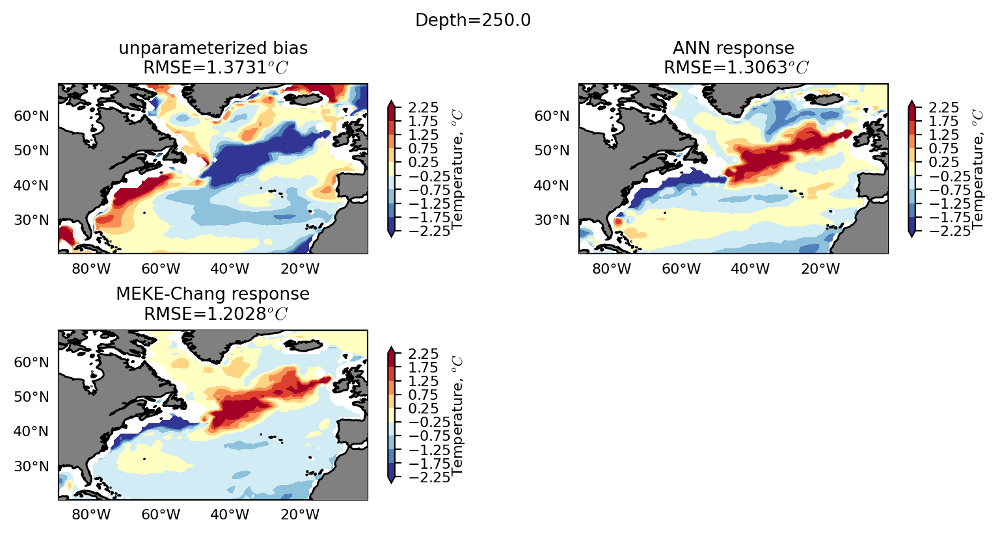

In [47]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_NA_large)

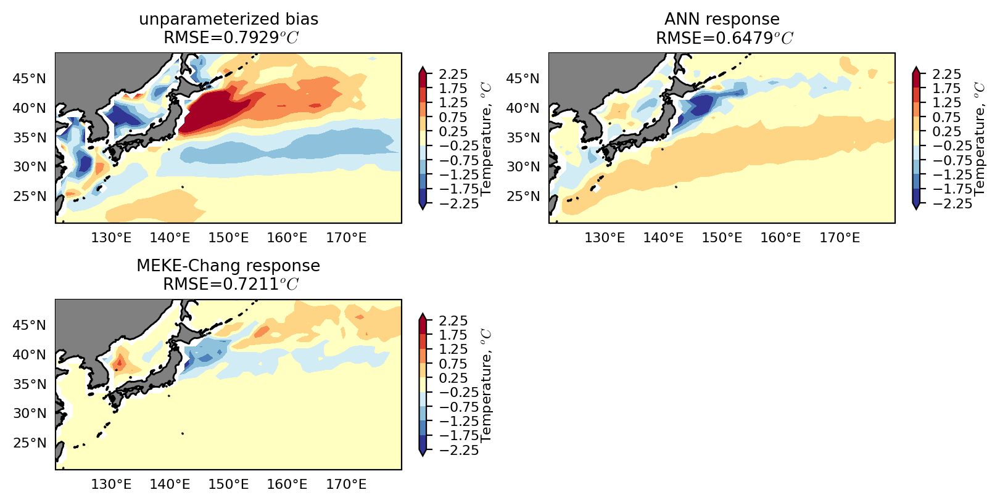

In [38]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=0, select=select_Kuroshio)

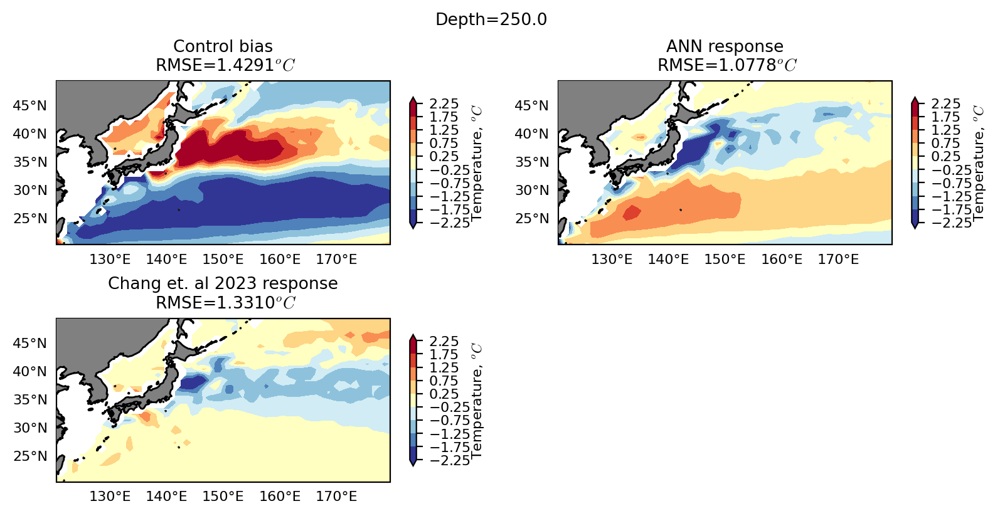

In [103]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control', 'ANN', 'Chang et. al 2023'], plot_type='response', zl=10, select=select_Kuroshio)

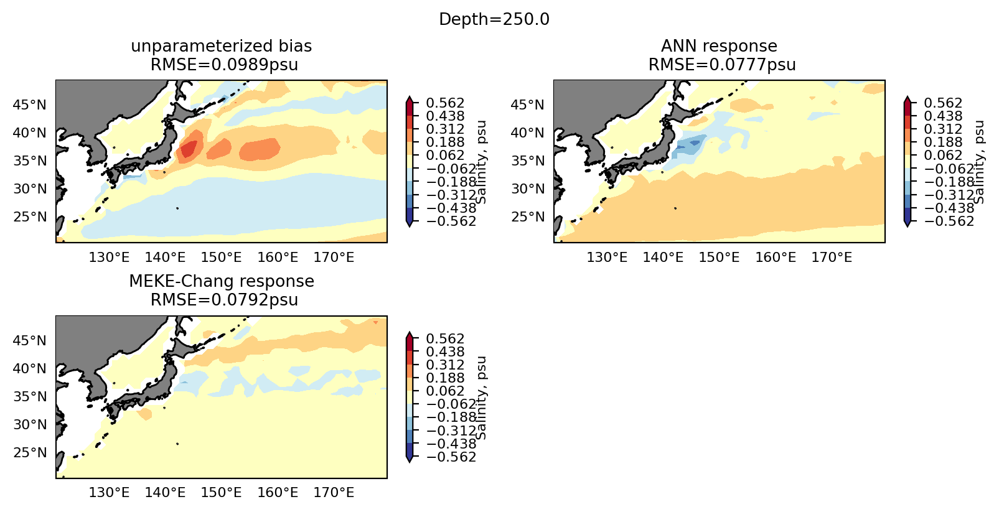

In [42]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_Kuroshio)

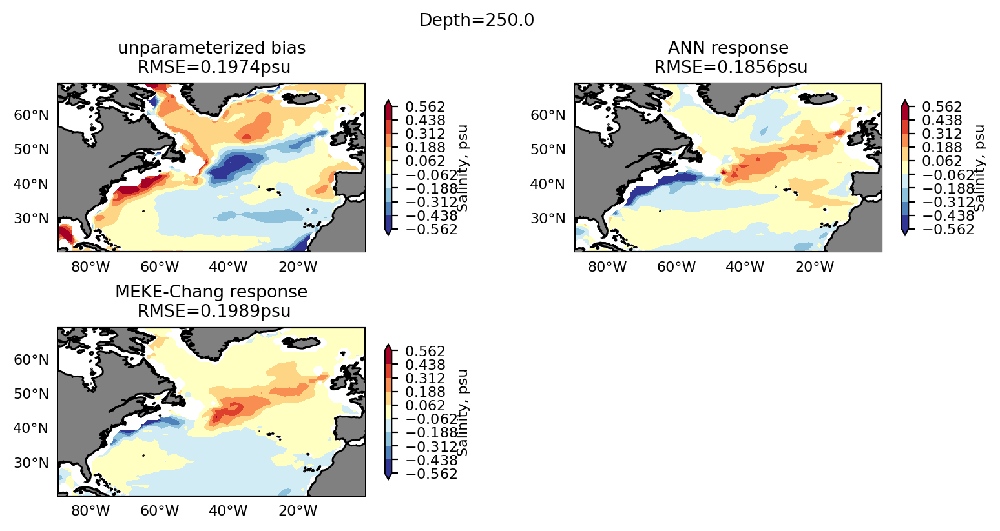

In [45]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_NA_large)

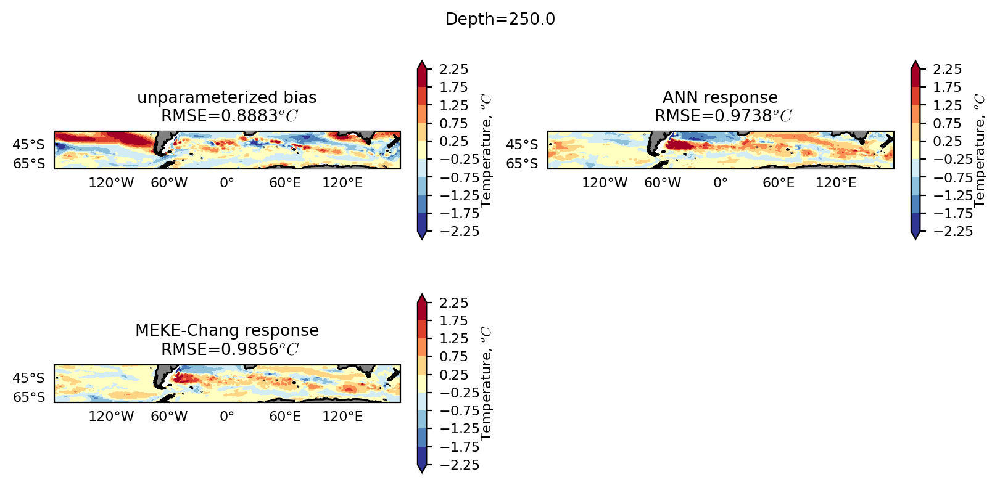

In [40]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_SO)

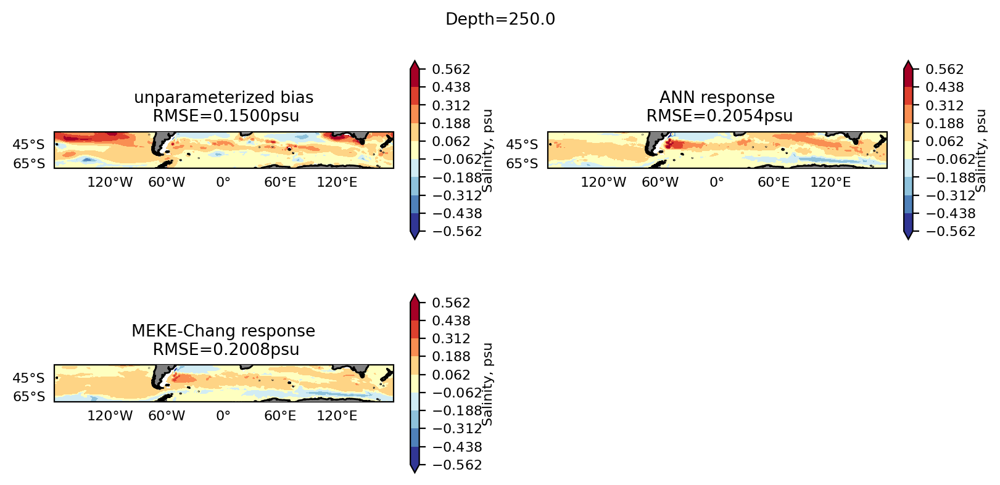

In [48]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_SO)

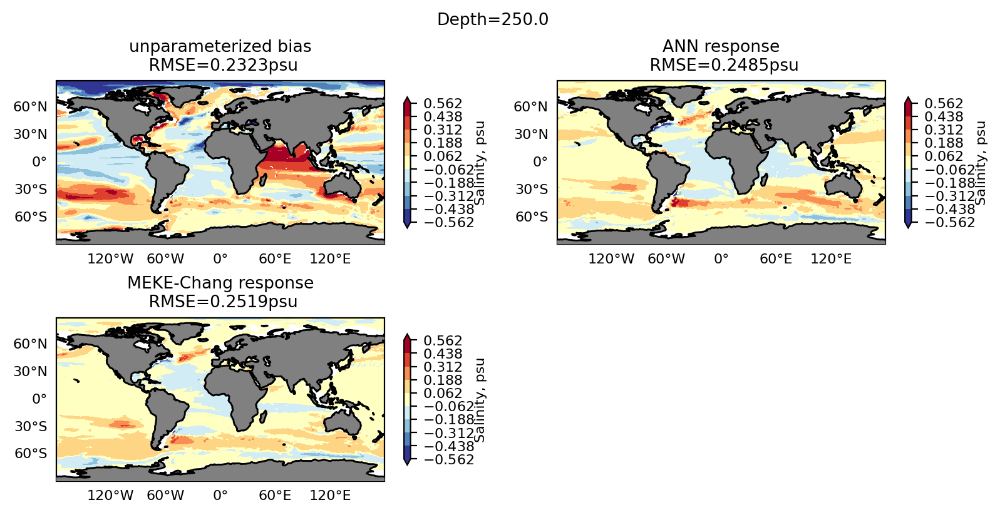

In [49]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_globe)

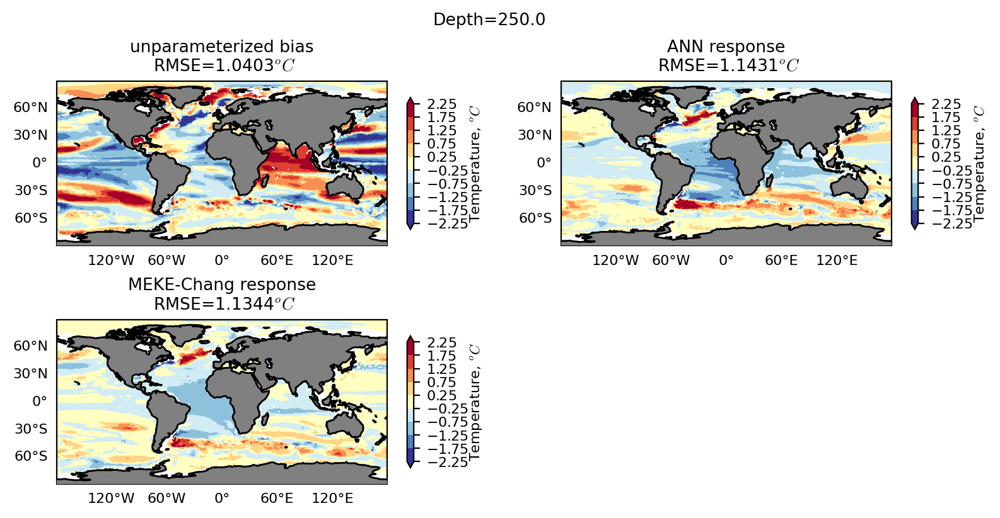

In [50]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], plot_type='response', zl=10, select=select_globe)

In [51]:
rho_ref_correction = 1.026
with ProgressBar():
    Drake_ann = 1e-9 * ds['ANN'].ocean_annual_z.umo.sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()
    Drake_MEKE = 1e-9 * ds['MEKE-Chang'].ocean_annual_z.umo.sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()
    Drake_ctrl_uo = rho_ref_correction * 1e-6 * (param.dyCu*dz*ds['unparameterized'].ocean_annual_z.uo).sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()

[########################################] | 100% Completed | 25.04 s
[########################################] | 100% Completed | 20.62 s
[########################################] | 100% Completed | 24.04 s


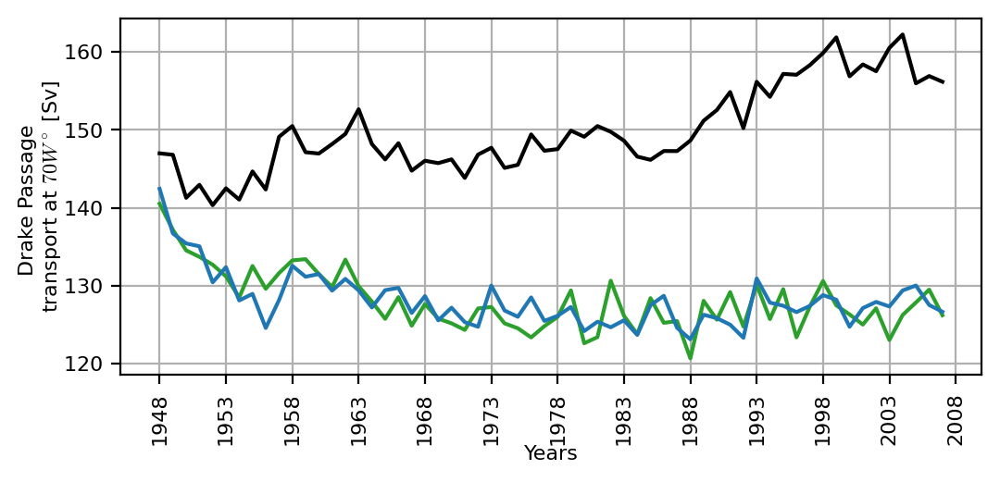

In [52]:
plt.figure(figsize=(6,2.5), dpi=200)
Drake_ctrl_uo.drop_vars('time').plot(color='k')
Drake_ann.drop_vars('time').plot(color='tab:green')
Drake_MEKE.drop_vars('time').plot(color='tab:blue')
plt.ylabel('Drake Passage \ntransport at $70W^\circ$ [Sv]')
plt.xlabel('Years')
plt.xticks(np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), 1948 + np.array([0,5,10,15,20,25,30,35,40,45,50,55,60]), rotation=90);
plt.title('')
plt.grid()

# AMOC

In [26]:
amoc_ctrl = ds['unparameterized'].AMOC
amoc_ann = ds['ANN'].AMOC
amoc_MEKE = ds['MEKE-Chang'].AMOC

generating basin codes
generating basin codes
generating basin codes


In [3]:
amoc_ctrl_new = ds['unparameterized'].AMOC_new
amoc_ann_new = ds['ANN'].AMOC_new
amoc_MEKE_new = ds['MEKE-Chang'].AMOC_new

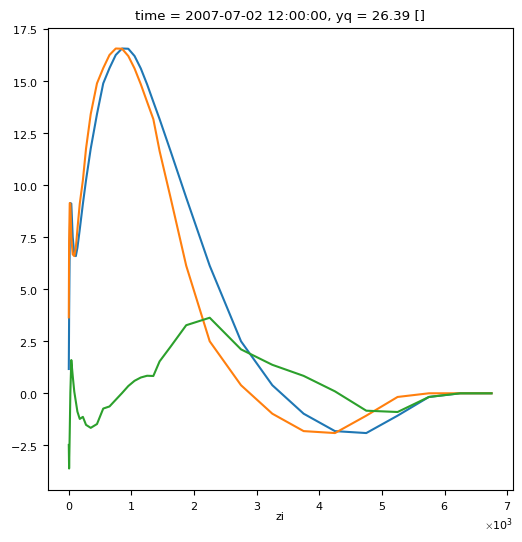

In [32]:
amoc_ctrl_new.sel(yq=26.5, method='nearest').isel(time=-1).plot()
amoc_ctrl.sel(yq=26.5, method='nearest').isel(time=-1).plot()
(amoc_ctrl_new-amoc_ctrl.rename({'z_i':'zi'})).sel(yq=26.5, method='nearest').isel(time=-1).plot()

Text(0.5, 48.55555555555554, 'Latitude')

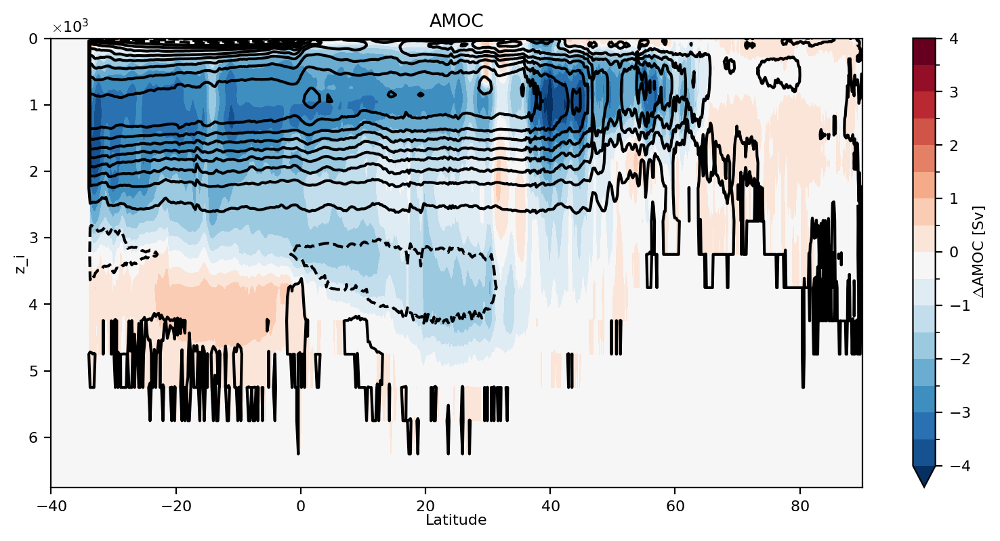

In [33]:
plt.figure(figsize=(8,4), dpi=200)
amoc_ctrl.sel(time=slice('1981','2007')).mean('time').plot.contour(levels=np.arange(-20,22,2), colors='k', linewidth=0.05)
(amoc_ann - amoc_ctrl).sel(time=slice('1981','2007')).mean('time').plot.contourf(levels=np.arange(-4,4.5,0.5), cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
plt.xlim([-40,None])
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('AMOC')
plt.xlabel('Latitude')

Text(0.5, 48.55555555555554, 'Latitude')

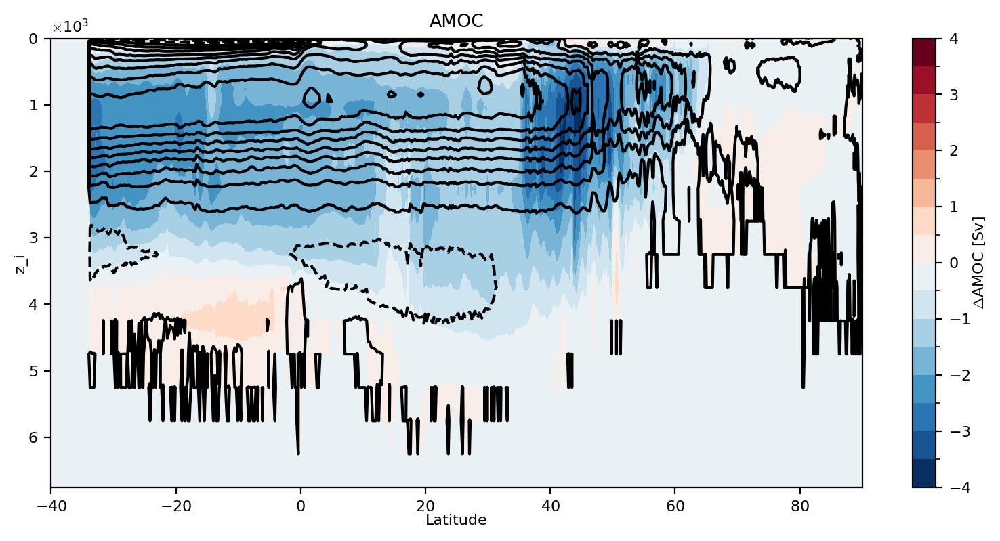

In [64]:
plt.figure(figsize=(8,4), dpi=200)
amoc_ctrl.sel(time=slice('1981','2007')).mean('time').plot.contour(levels=np.arange(-20,22,2), colors='k', linewidth=0.05)
(amoc_MEKE - amoc_ctrl).sel(time=slice('1981','2007')).mean('time').plot.contourf(levels=np.arange(-4,4.5,0.5), cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
plt.xlim([-40,None])
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('AMOC')
plt.xlabel('Latitude')

In [4]:
rapid = xr.open_dataset('../data/moc_vertical.nc').stream_function_mar

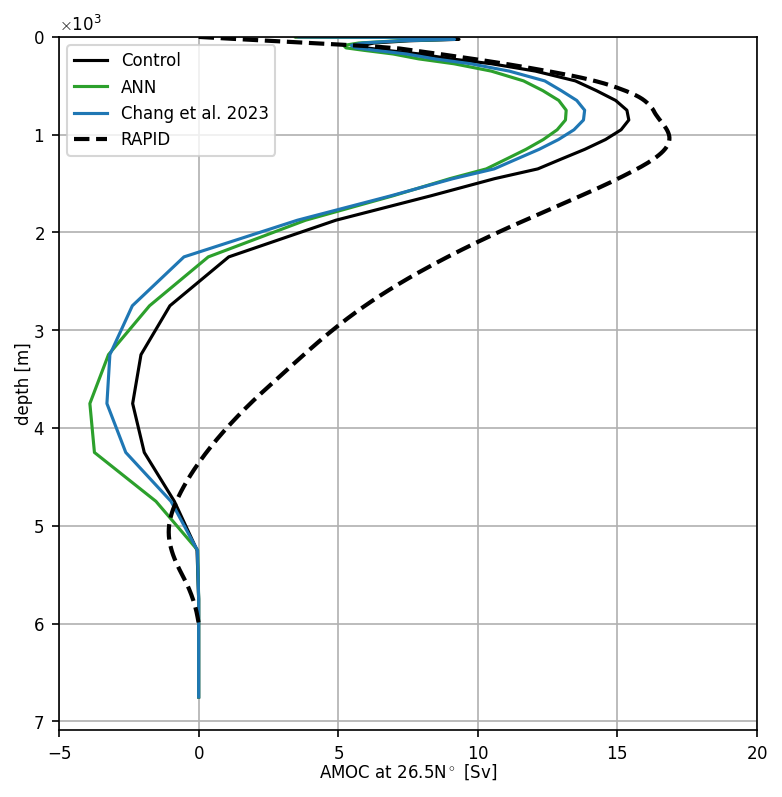

In [68]:
plt.figure(dpi=150)
amoc_ctrl.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='z_i', color='k', label='Control')
amoc_ann.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='z_i', color='tab:green', label='ANN')
amoc_MEKE.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='z_i', color='tab:blue', label='Chang et al. 2023')
rapid.mean('time').plot(lw=2,ls='--', label='RAPID', y='depth', color='k')
plt.ylim([0,None])
plt.gca().invert_yaxis()
plt.xlim([-5,20])
plt.title('')
plt.xlabel('AMOC at 26.5N$^\circ$ [Sv]')
plt.legend()
plt.grid()

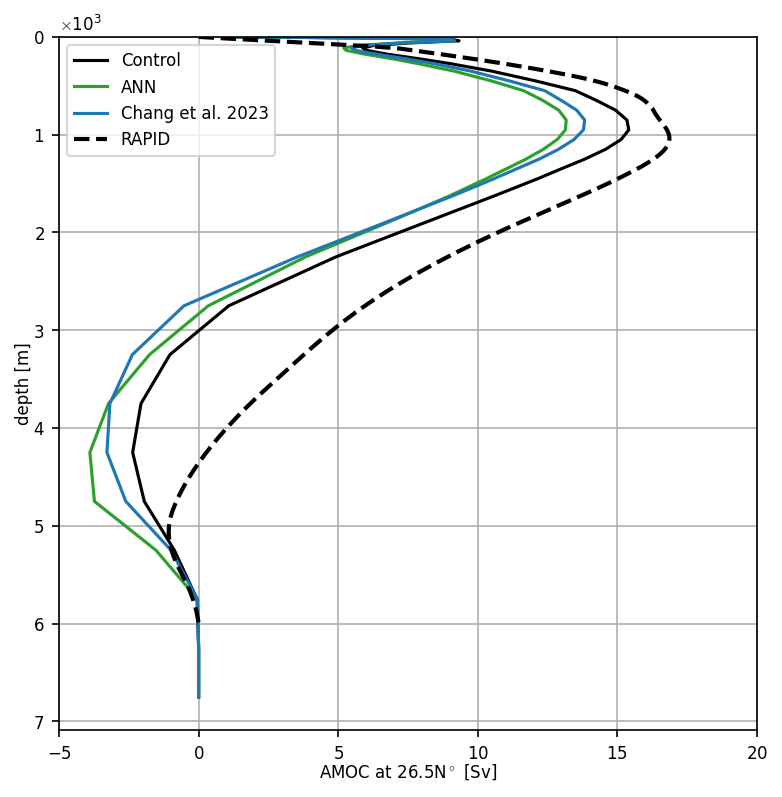

In [35]:
plt.figure(dpi=150)
amoc_ctrl_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', color='k', label='Control')
amoc_ann_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', color='tab:green', label='ANN')
amoc_MEKE_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', color='tab:blue', label='Chang et al. 2023')
rapid.mean('time').plot(lw=2,ls='--', label='RAPID', y='depth', color='k')
plt.ylim([0,None])
plt.gca().invert_yaxis()
plt.xlim([-5,20])
plt.title('')
plt.xlabel('AMOC at 26.5N$^\circ$ [Sv]')
plt.legend()
plt.grid()

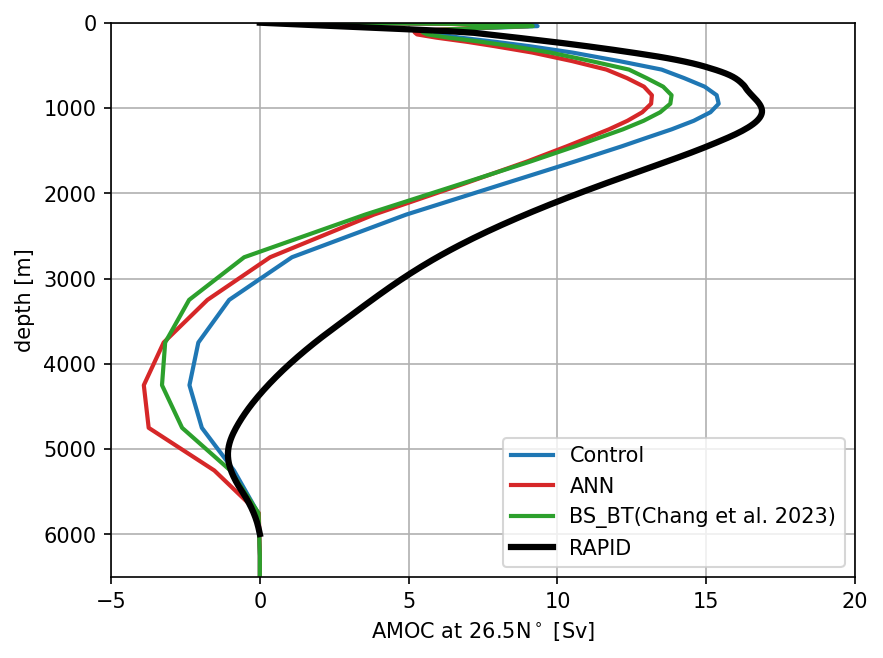

In [7]:
plt.figure(dpi=150)
amoc_ctrl_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', lw=2, color='tab:blue', label='Control')
amoc_ann_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', lw=2, color='tab:red', label='ANN')
amoc_MEKE_new.sel(yq=26.5, method='nearest').sel(time=slice('1981','2007')).mean('time').plot(y='zi', lw=2, color='tab:green', label='BS_BT(Chang et al. 2023)')
rapid.mean('time').plot(lw=3,ls='-', label='RAPID', y='depth', color='k')
plt.ylim([0,6500])
plt.gca().invert_yaxis()
plt.xlim([-5,20])
plt.title('')
plt.xlabel('AMOC at 26.5N$^\circ$ [Sv]')
plt.legend()
plt.grid()

# SO MOC

In [89]:
zrho = ds['unparameterized'].ocean_annual_rho2.thkcello.mean('xh').cumsum('rho2_l').isel(time=0).compute()

In [91]:
moc_ctrl = ds['unparameterized'].MOC_rho2.isel(time=-1)

generating basin codes


In [92]:
moc_ann = ds['ANN'].MOC_rho2.isel(time=-1)

generating basin codes


In [96]:
moc_MEKE = ds['MEKE-Chang'].MOC_rho2.sel(time='2003').squeeze()

generating basin codes


Text(0.5, 1.0, 'ANN-Control')

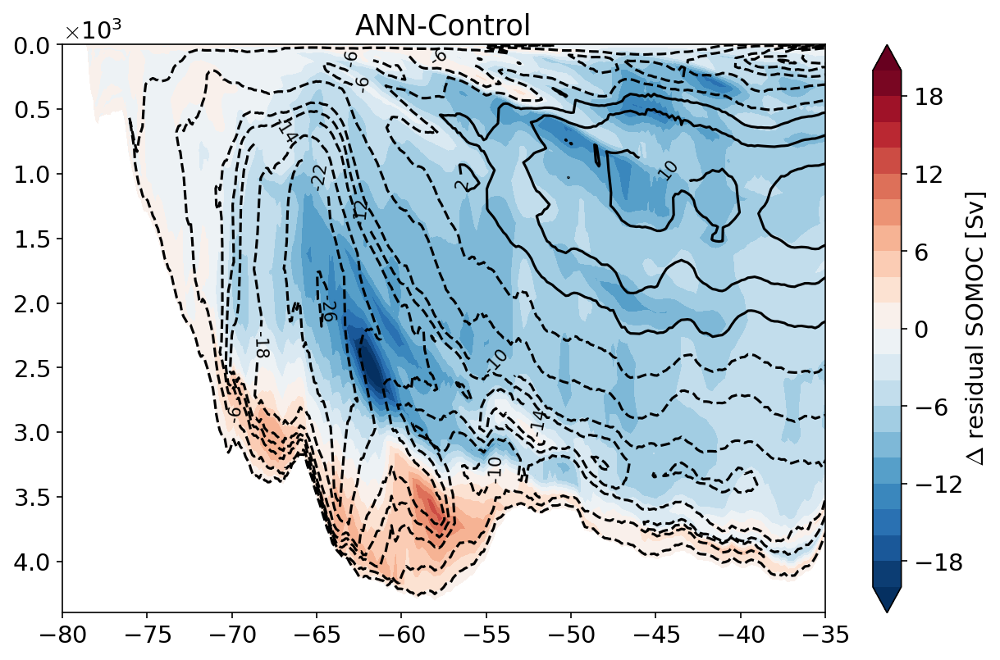

In [97]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc_ctrl.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(moc_ann-moc_ctrl)[:-1], levels=np.arange(-20,20+2,2), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='$\Delta$ residual SOMOC [Sv]')
CS = plt.contour(x,z,moc_ctrl[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('ANN-Control')

Text(0.5, 1.0, 'Chang2023-Control')

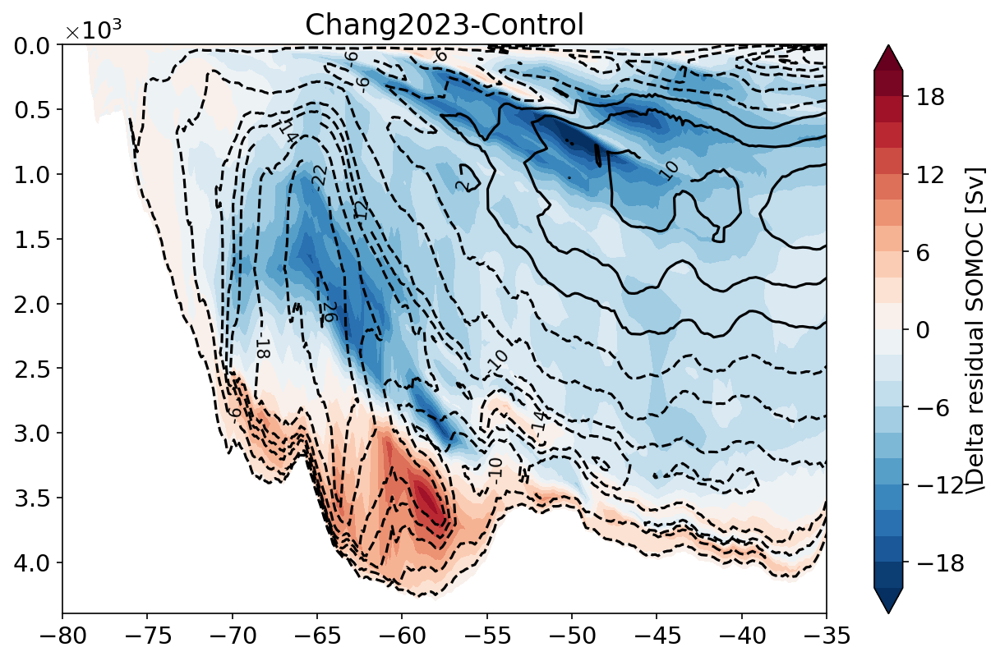

In [98]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc_ctrl.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(moc_MEKE-moc_ctrl)[:-1], levels=np.arange(-20,20+2,2), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='\Delta residual SOMOC [Sv]')
CS = plt.contour(x,z,moc_ctrl[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('Chang2023-Control')

Text(0.5, 1.0, 'Chang2023')

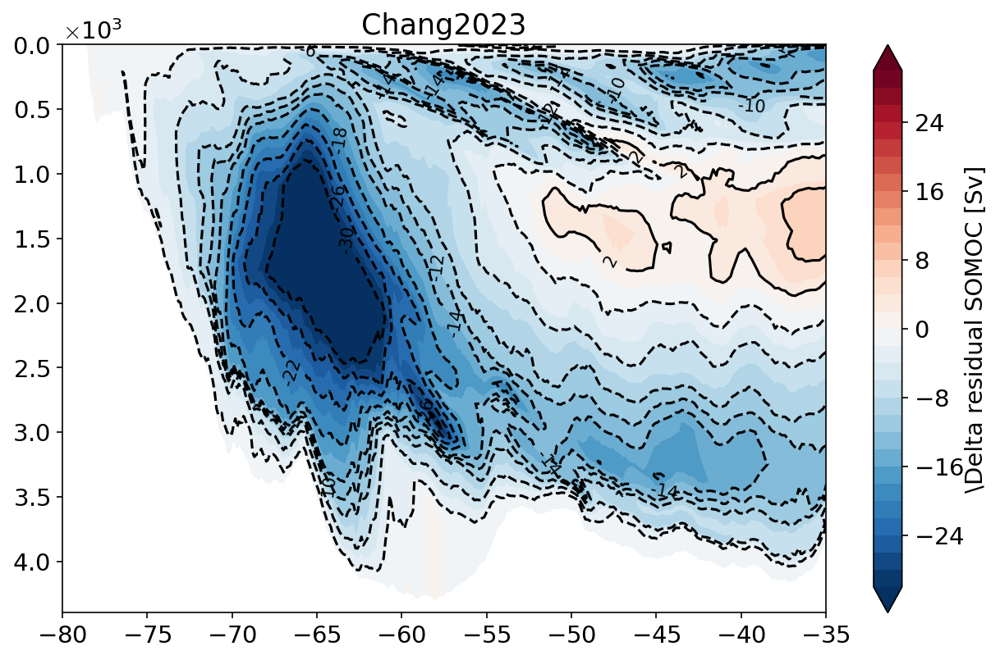

In [99]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc_ctrl.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(moc_MEKE)[:-1], levels=np.arange(-30,30+2,2), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='\Delta residual SOMOC [Sv]')
CS = plt.contour(x,z,moc_MEKE[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('Chang2023')

Text(0.5, 1.0, 'Control')

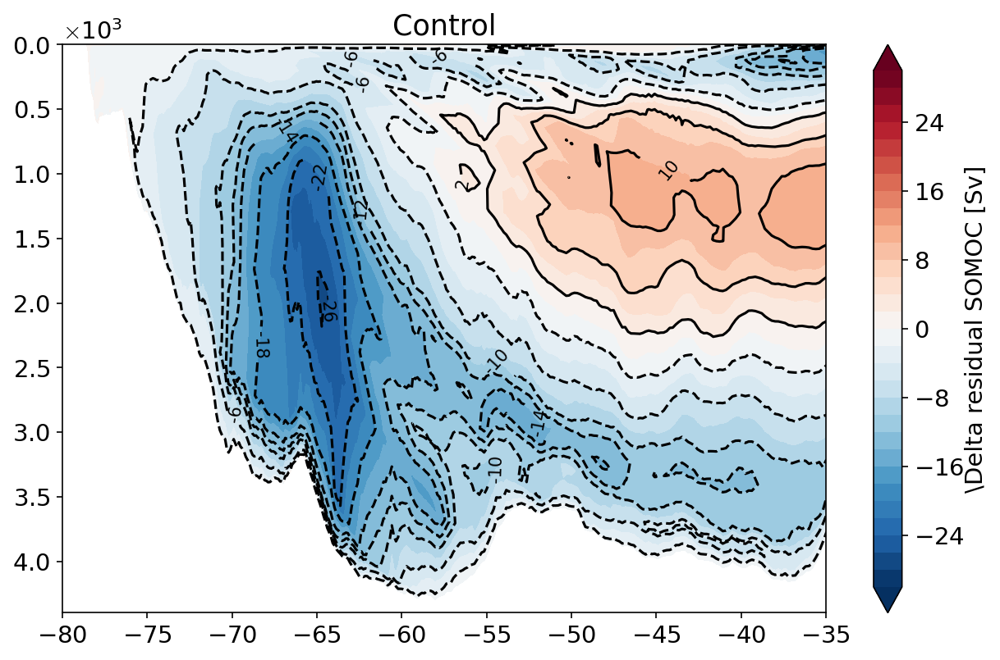

In [100]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc_ctrl.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(moc_ctrl)[:-1], levels=np.arange(-30,30+2,2), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='\Delta residual SOMOC [Sv]')
CS = plt.contour(x,z,moc_ctrl[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('Control')

Text(0.5, 1.0, 'ANN')

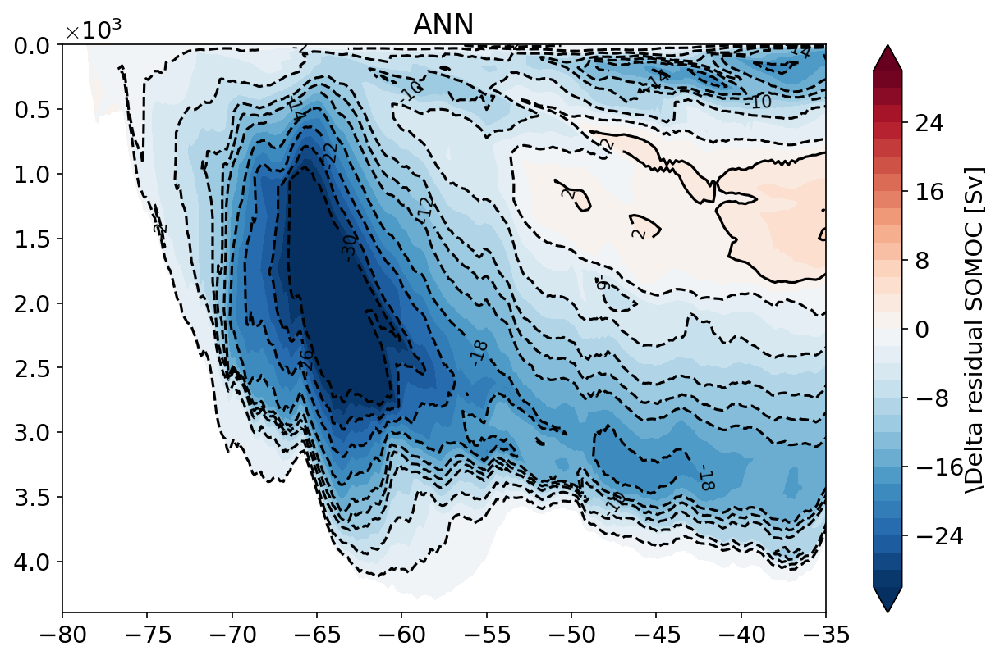

In [101]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc_ctrl.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(moc_ann)[:-1], levels=np.arange(-30,30+2,2), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='\Delta residual SOMOC [Sv]')
CS = plt.contour(x,z,moc_ann[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('ANN')

# MLD

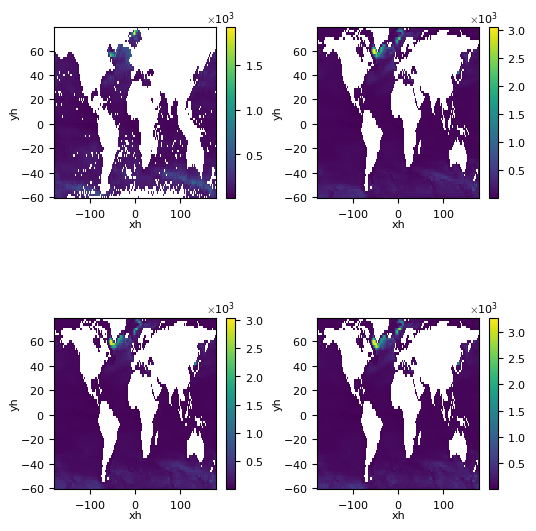

In [46]:
plt.subplot(2,2,1)
ds['unparameterized'].MLD_winter_obs.plot()
plt.subplot(2,2,2)
ds['unparameterized'].MLD_winter.plot()
plt.subplot(2,2,3)
ds['ANN'].MLD_winter.plot()
plt.subplot(2,2,4)
ds['MEKE-Chang'].MLD_winter.plot()

In [47]:
mask_om4 = xr.where(np.isnan(ds['unparameterized'].MLD_winter),np.nan,1.)
mask_obs = xr.where(np.isnan(ds['unparameterized'].MLD_winter_obs),np.nan,1.)
mask_combine = mask_om4 * mask_obs

In [54]:
mask_combine * ds['unparameterized'].MLD_winter_obs

<xarray.DataArray (yh: 70, xh: 180)> Size: 101kB
array([[231.70222753, 190.79992237, 210.65898454, ..., 239.39362525,
        221.37441836, 213.61893848],
       [247.97516809, 240.01628266, 231.51130373, ..., 340.64934151,
        252.20219774, 231.26196613],
       [275.27540528, 335.18468136, 275.67010939, ..., 297.18152776,
        284.25677409, 255.7591189 ],
       ...,
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan]])
Coordinates:
  * yh       (yh) float64 560B -60.0 -58.0 -56.0 -54.0 ... 72.0 74.0 76.0 78.0
  * xh       (xh) float64 1kB -179.0 -177.0 -175.0 -173.0 ... 175.0 177.0 179.0

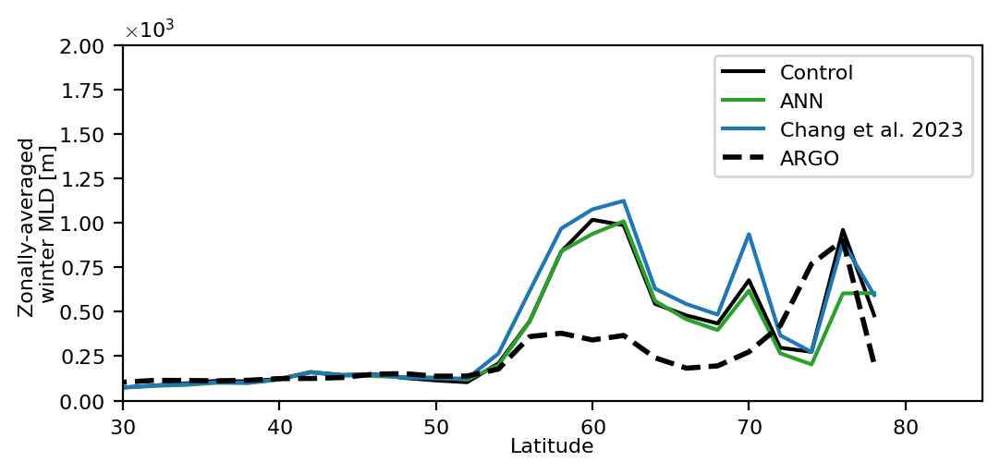

In [62]:
plt.figure(figsize=(6,2.5), dpi=200)
(mask_combine * ds['unparameterized'].MLD_winter).mean('xh').plot(color='k', label='Control')
(mask_combine * ds['ANN'].MLD_winter).mean('xh').plot(color='tab:green', label='ANN')
(mask_combine * ds['MEKE-Chang'].MLD_winter).mean('xh').plot(color='tab:blue', label='Chang et al. 2023')
(mask_combine * ds['unparameterized'].MLD_winter_obs).mean('xh').plot(color='k', lw=2, ls='--', label='ARGO')
plt.ylabel('Zonally-averaged \nwinter MLD [m]')
plt.xlabel('Latitude')
plt.xlim([30,None])
plt.ylim([0, 2000])
plt.legend()

# Heat transport

In [63]:
MHT_full_code_ctrl = ds['unparameterized'].budget.T_ady_2d.mean('time').sum('xh').compute()
MHT_full_code_ann = ds['ANN'].budget.T_ady_2d.mean('time').sum('xh').compute()

In [67]:
with ProgressBar():
    MHT_full_code_meke = ds['MEKE-Chang'].ocean_month.T_ady_2d.sel(time=slice('2003','2003')).mean('time').sum('xh').compute()

[########################################] | 100% Completed | 1.11 sms


Text(0.5, 1.0, 'Averaged over year 2003')

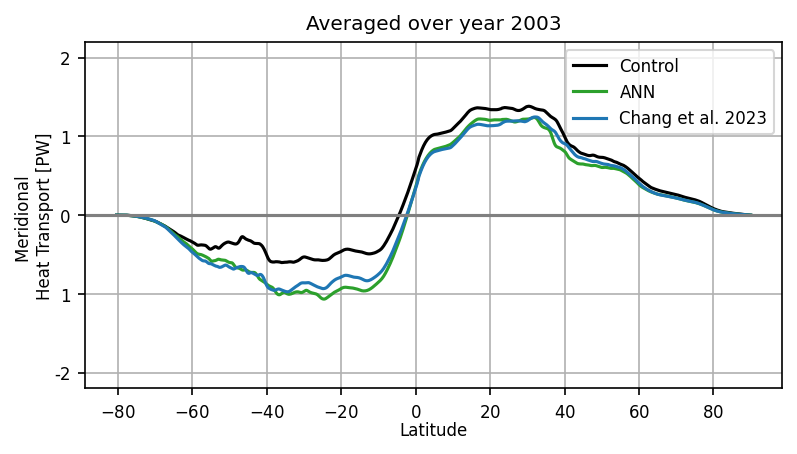

In [69]:
plt.figure(figsize=(6,3), dpi=150)
(MHT_full_code_ctrl).plot(label='Control', color='k')
(MHT_full_code_ann).plot(label='ANN', color='tab:green')
(MHT_full_code_meke).plot(label='Chang et al. 2023', color='tab:blue')
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('')
plt.ylabel('Meridional \nHeat Transport [PW]')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.yticks([-2e15, -1e15, 0, 1e15, 2e15], [-2,1,0,1,2])
plt.grid()
plt.xlabel('Latitude')
plt.title('Averaged over year 2003')

In [74]:
ds['MEKE-Chang'].ice.sithick.sel(time='2003')

<xarray.DataArray 'sithick' (time: 12, yT: 1080, xT: 1440)> Size: 75MB
dask.array<getitem, shape=(12, 1080, 1440), dtype=float32, chunksize=(1, 1080, 1440), chunktype=numpy.ndarray>
Coordinates:
  * xT       (xT) float64 12kB -299.7 -299.5 -299.2 -299.0 ... 59.53 59.78 60.03
  * yT       (yT) float64 9kB -80.39 -80.31 -80.23 -80.15 ... 89.73 89.84 89.95
  * time     (time) object 96B 2003-01-16 12:00:00 ... 2003-12-16 12:00:00
Attributes:
    long_name:      ice thickness
    units:          m-ice
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT

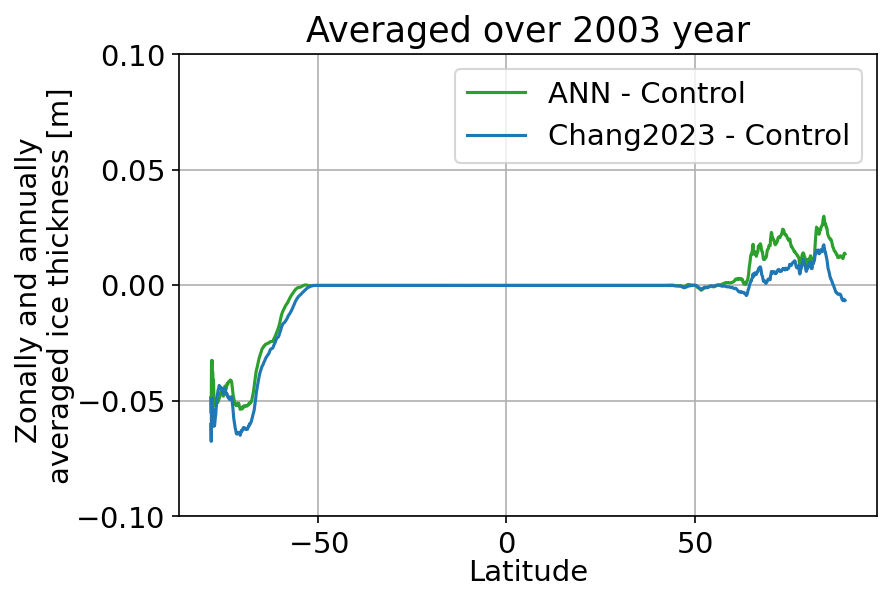

In [87]:
from helpers.plot_helpers import default_rcParams
#default_rcParams({})
plt.figure(figsize=(6,4), dpi=150)
(ds['ANN'].ice.sithick.mean('time').mean('xT') - ds['unparameterized'].ice.sithick.mean('time').mean('xT')).plot(color='tab:green', label='ANN - Control')
(ds['MEKE-Chang'].ice.sithick.sel(time='2003').mean('time').mean('xT') - ds['unparameterized'].ice.sithick.mean('time').mean('xT')).plot(color='tab:blue', label='Chang2023 - Control')
plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Zonally and annually \naveraged ice thickness [m]')
plt.title('Averaged over 2003 year')
plt.ylim([-0.1,0.1])
plt.grid()

Text(0.5, 1.0, 'Averaged over 2003 year')

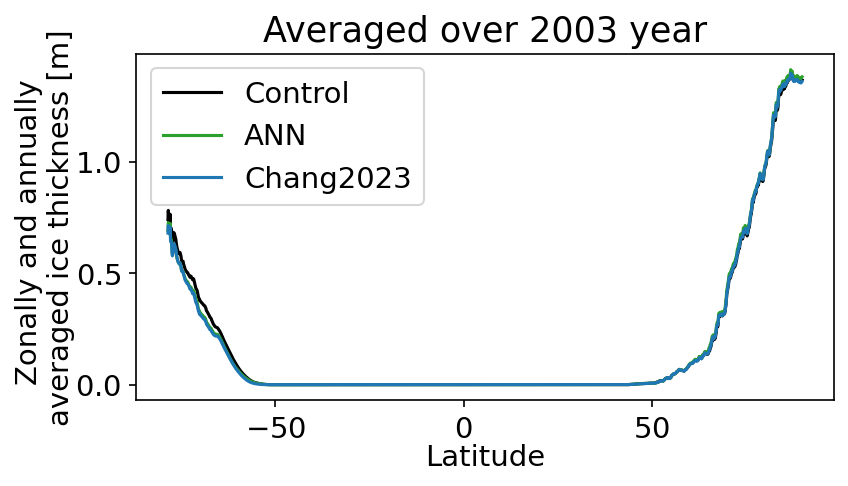

In [88]:
plt.figure(figsize=(6,3), dpi=150)
(ds['unparameterized'].ice.sithick.mean('time').mean('xT')).plot(color='k', label='Control')
(ds['ANN'].ice.sithick.mean('time').mean('xT')).plot(color='tab:green', label='ANN')
(ds['MEKE-Chang'].ice.sithick.sel(time='2003').mean('time').mean('xT')).plot(color='tab:blue', label='Chang2023')
plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Zonally and annually \naveraged ice thickness [m]')
plt.title('Averaged over 2003 year')

# Current strength change

In [323]:
def uabs(exp, time_slice):
    grid = create_grid_global(exp.param)
    u_mean = grid.interp(exp.ocean_annual_z.uo.sel(time=time_slice).mean('time'), 'X')
    v_mean = grid.interp(exp.ocean_annual_z.vo.sel(time=time_slice).mean('time'), 'Y')
    velocity = np.sqrt(u_mean**2 + v_mean**2).compute()
    return exp.regrid(velocity, velocity)

In [324]:
with ProgressBar():
    uabs_ctrl = uabs(ds['unparameterized'], slice('1965', '1974'))

[########################################] | 100% Completed | 8.45 ss


In [325]:
with ProgressBar():
    uabs_ann = uabs(ds['ANN'], slice('1965', '1974'))
    uabs_meke = uabs(ds['MEKE-Chang'], slice('1965', '1974'))

[########################################] | 100% Completed | 8.06 ss
[########################################] | 100% Completed | 8.56 ss


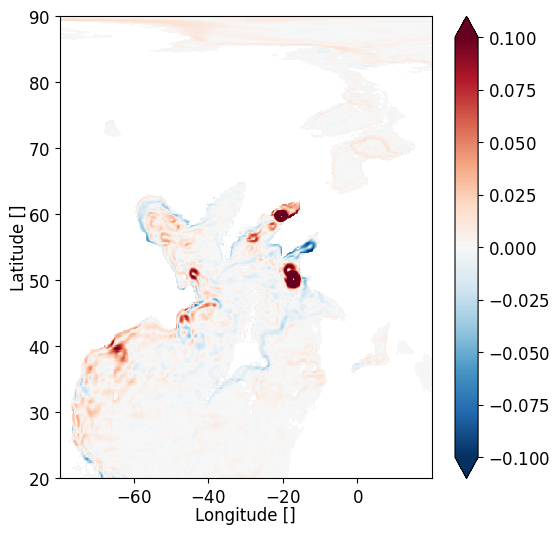

In [346]:
select_NA_Jenny(uabs_ann-uabs_ctrl).isel(zl=26).plot(vmin=-0.1)

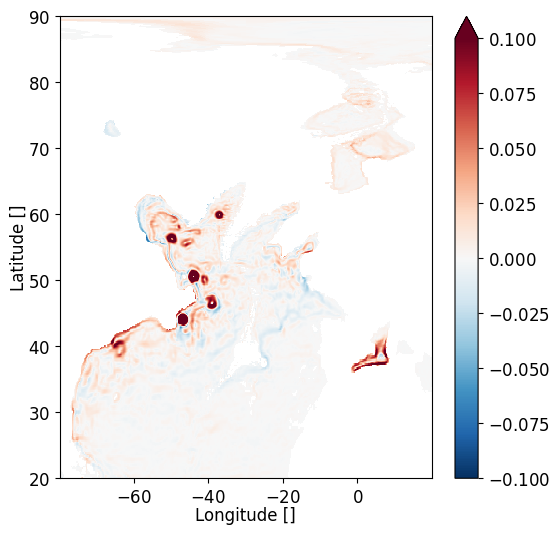

In [345]:
select_NA_Jenny(uabs_meke-uabs_ctrl).isel(zl=26).plot(vmin=-0.1)

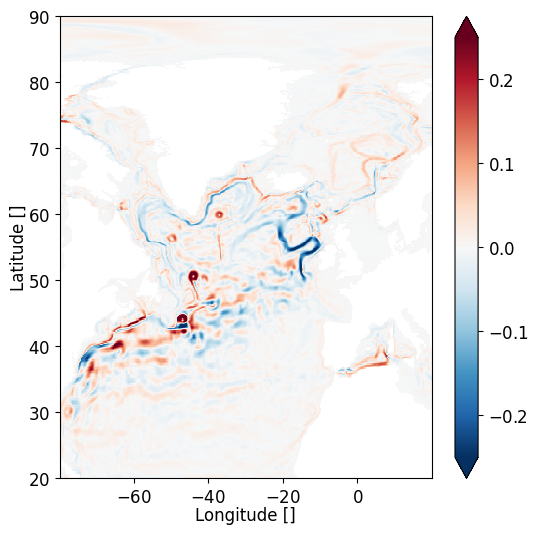

In [342]:
select_NA_Jenny(uabs_meke-uabs_ctrl).isel(zl=0).plot(vmin=-0.25)

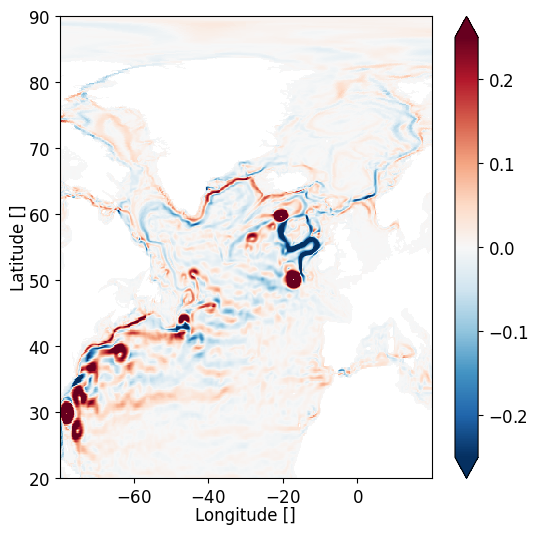

In [344]:
select_NA_Jenny(uabs_ann-uabs_ctrl).isel(zl=0).plot(vmin=-0.25)

# Stratification change

In [48]:
N2_ctrl = (ds['unparameterized'].N_buoyancy_frequency**2).sel(time=slice('1981','2007')).mean('time').mean('xh').compute()
N2_obs = (ds['unparameterized'].N_buoyancy_frequency_woa**2).mean('xh').compute()
N2_ann = (ds['ANN'].N_buoyancy_frequency**2).sel(time=slice('1981','2007')).mean('time').mean('xh').compute()
N2_meke = (ds['MEKE-Chang'].N_buoyancy_frequency**2).sel(time=slice('1981','2007')).mean('time').mean('xh').compute()

In [104]:
sigma2_obs = ds['unparameterized'].woa_sigma2.mean('xh').compute()

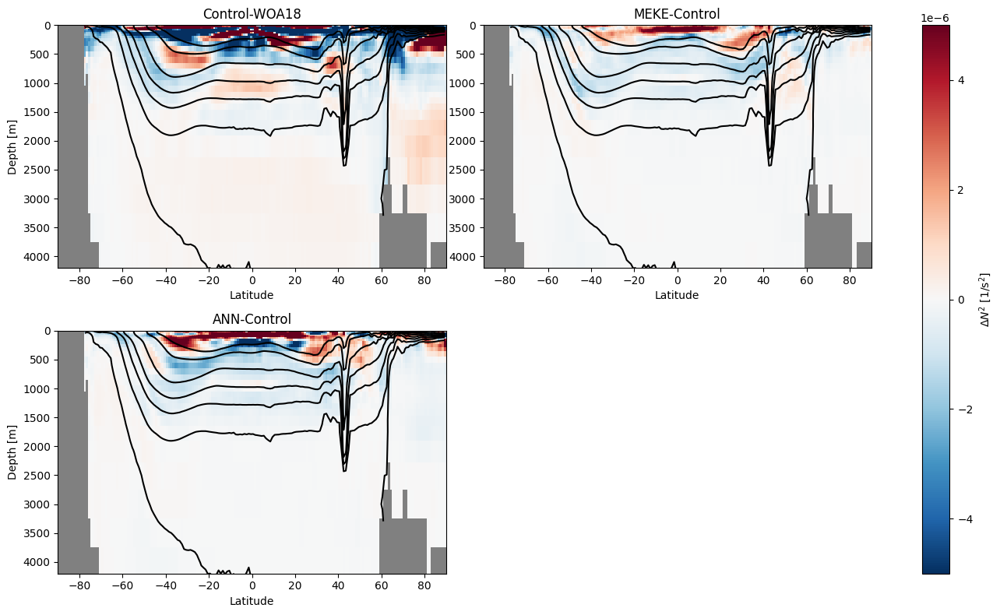

In [106]:
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
im=(N2_ctrl-N2_obs).plot(vmin=-5e-6, add_colorbar=False)
sigma2_obs.plot.contour(levels=[35,35.5,36,36.3,36.5,36.7,36.9], colors='k')
plt.ylim([0,4200])
plt.gca().invert_yaxis()
plt.ylabel('Depth [m]')
plt.xlabel('Latitude')
plt.title('Control-WOA18')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
im=(N2_meke-N2_ctrl).plot(vmin=-5e-6, add_colorbar=False)
sigma2_obs.plot.contour(levels=[35,35.5,36,36.3,36.5,36.7,36.9], colors='k')
plt.ylim([0,4200])
plt.gca().invert_yaxis()
plt.ylabel('')
plt.xlabel('Latitude')
plt.title('MEKE-Control')
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
im=(N2_ann-N2_ctrl).plot(vmin=-5e-6, add_colorbar=False)
sigma2_obs.plot.contour(levels=[35,35.5,36,36.3,36.5,36.7,36.9], colors='k')
plt.ylim([0,4200])
plt.gca().invert_yaxis()
plt.ylabel('Depth [m]')
plt.xlabel('Latitude')
plt.title('ANN-Control')
plt.gca().set_facecolor('gray')

plt.tight_layout()
plt.colorbar(im, ax=plt.gcf().axes, label='$\Delta N^2$ [1/s$^2$]')
plt.savefig('deltaN2.pdf')

# Bar plot

In [76]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

In [84]:
param = ds['unparameterized'].param
dz = ds['unparameterized'].dz
mask_nan = xr.where(np.isnan(ds['MEKE-Chang'].ocean_annual_z.thetao.isel(time=0)), np.nan, 1.).compute()
dV = mask_nan * param.areacello * dz

In [85]:
def ave(x):
    return (x * dV).sum(['zl','xh','yh']) / dV.sum(['zl', 'xh', 'yh'])

In [86]:
thetao = {}
with ProgressBar():
    for exp in ['unparameterized', 'ANN', 'MEKE-Chang']:
        thetao[exp] = ave(ds[exp].ocean_annual_z.thetao).compute()

[########################################] | 100% Completed | 3.23 sms
[########################################] | 100% Completed | 41.40 s
[########################################] | 100% Completed | 2.75 sms
[########################################] | 100% Completed | 22.63 s
[########################################] | 100% Completed | 26.26 s


In [2]:
obs = xr.open_dataset('~/global-runs/data/woa_1981_2010.nc', decode_times=False).squeeze()

In [3]:
dz_obs = xr.DataArray(np.diff(obs.depth_bnds,1).squeeze(), dims='depth')

# WOA uses 1-degree grid
lon_spacing = 1
lat_spacing = 1
R_earth = 6.378e+6 # Radius of earth in metres

dx_obs = np.deg2rad(lon_spacing) * R_earth * np.cos(np.deg2rad(obs.lat))
dy_obs = np.deg2rad(lat_spacing) * R_earth
mask_nan = xr.where(np.isnan(obs.t_an), np.nan, 1.).compute()
dV_obs = mask_nan * dx_obs * dy_obs * dz_obs

In [4]:
def ave_obs(x):
    return (x * dV_obs).sum(['depth','lon','lat']) / dV_obs.sum(['depth', 'lon', 'lat'])

In [6]:
#WOA 18
ave_obs(obs.t_an).compute()

<xarray.DataArray ()> Size: 8B
array(3.67995122)
Coordinates:
    time     float32 4B 1.878e+03

In [145]:
# See cDrake also for error bounds https://agupubs.onlinelibrary.wiley.com/doi/pdf/10.1002/2016GL070319
Drake['obs'] = 173.3

In [157]:
# AMOC RAPID
xr.open_dataset('../data/AMOC_26p5_max_RAPID_annual_2004-2021.nc', decode_times=False).mean('time').AMOC

<xarray.DataArray 'AMOC' ()> Size: 8B
array(16.84878045)

In [152]:
# Most statistics are averaged over 1981-2007, which is 27 years. Time series have 4 samples per day
for exp in ['unparameterized', 'ANN', 'MEKE-Chang']:
    KE = ds[exp].series.KE.sum('Layer')[-27*365*4:].mean() * 1e-18
    APE = ds[exp].series.APE.sum('Interface')[-27*365*4:].mean() * 1e-20
    temp = thetao[exp].sel(time=slice('1981','2007')).mean('time')
    Drake = 1e-9 * ds[exp].ocean_annual_z.umo.sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).sel(time=slice('1981','2007')).mean('time').compute()
    amoc = ds[exp].AMOC_new.sel(yq=26.5,method='nearest').sel(time=slice('1981','2007')).mean('time').max()
    
    print(exp, ', KE=%.2f' % KE, ', APE=%.2f' % APE, ', temp=%.2f' % temp, ', Drake=%.2f' % Drake, 'AMOC=%.2f' % amoc)

unparameterized , KE=2.72 , APE=3.88 , temp=3.44 , Drake=154.56 AMOC=15.42
ANN , KE=3.91 , APE=3.64 , temp=3.34 , Drake=126.55 AMOC=13.17
MEKE-Chang , KE=3.60 , APE=3.64 , temp=3.37 , Drake=126.73 AMOC=13.83


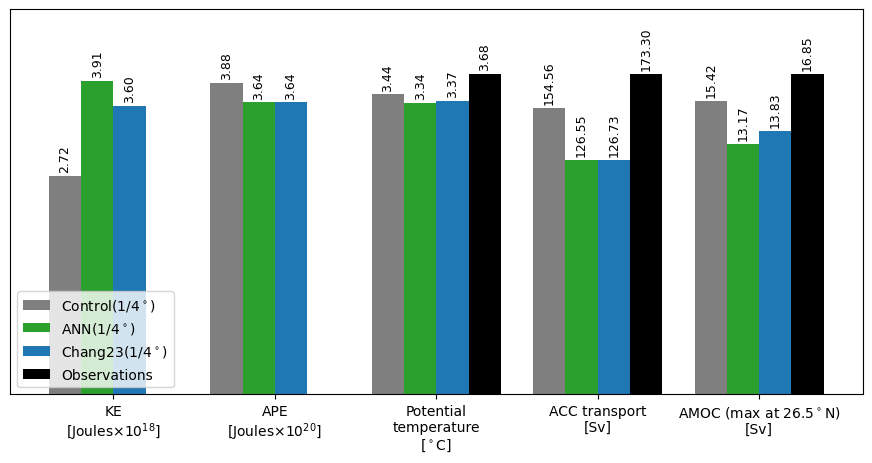

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# Metric labels
metrics = ['KE\n[Joules$\\times10^{18}$]', 'APE\n[Joules$\\times10^{20}$]', 'Potential\ntemperature\n[$^\circ$C]', 'ACC transport\n[Sv]', 'AMOC (max at $26.5^\circ$N)\n[Sv]']

# Raw values of metrics for three models and observations
model_a_raw = [2.72, 3.88, 3.44, 154.56, 15.42]
model_b_raw = [3.91, 3.64, 3.34, 126.55, 13.17]
model_c_raw = [3.60, 3.64, 3.37, 126.73, 13.83]
obs_raw     = [4, 4, 3.67995122, 173.3, 16.84878045]

# Observations always have the bar of same height
model_a = np.array(model_a_raw) / np.array(obs_raw)
model_b = np.array(model_b_raw) / np.array(obs_raw)
model_c = np.array(model_c_raw) / np.array(obs_raw)
obs     = np.ones_like(obs_raw)
obs[0:2] = np.nan

# Bar plot setup
x = np.arange(len(metrics))
width = 0.2  # Adjust width for 4 bars

fig, ax = plt.subplots(figsize=(11, 5))

# Plot bars
ax.bar(x - 1.5*width, model_a, width, label='Control($1/4^\circ$)', color='tab:gray')
ax.bar(x - 0.5*width, model_b, width, label='ANN($1/4^\circ$)', color='tab:green')
ax.bar(x + 0.5*width, model_c, width, label='Chang23($1/4^\circ$)', color='tab:blue')
ax.bar(x + 1.5*width, obs, width, label='Observations', color='k')

# X-axis labels
ax.set_xticks(x)
ax.set_xticklabels(metrics, rotation=0, fontsize=10)

# Remove y-axis
ax.set_yticks([])
ax.set_ylabel('')

# Title and legend
#ax.set_title('Comparison of ANN to Chang et. al 2023 in global ocean model OM4', fontsize=12)
ax.legend(loc='lower left')

# Optional: Add bar value labels
for idx in range(len(metrics)):
    ax.text(x[idx] - 1.5*width, model_a[idx] + 0.02, f'{model_a_raw[idx]:.2f}', ha='center', fontsize=9, rotation=90)
    ax.text(x[idx] - 0.5*width, model_b[idx] + 0.02, f'{model_b_raw[idx]:.2f}', ha='center', fontsize=9, rotation=90)
    ax.text(x[idx] + 0.5*width, model_c[idx] + 0.02, f'{model_c_raw[idx]:.2f}', ha='center', fontsize=9, rotation=90)
    if np.isnan(obs[idx]):
        pass
    else:
        ax.text(x[idx] + 1.5*width, obs[idx] + 0.02, f'{obs_raw[idx]:.2f}', ha='center', fontsize=9, rotation=90)

plt.ylim([0, 1.2])
plt.savefig('metrics-ANN-Chang.pdf', bbox_inches='tight')

# Regional biases for paper

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

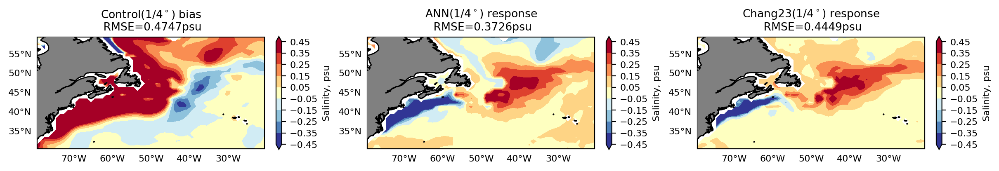

In [47]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', zl=0, select=select_Gulf, ncols=3)
plt.savefig('NA-bias-S.pdf', bbox_inches='tight')

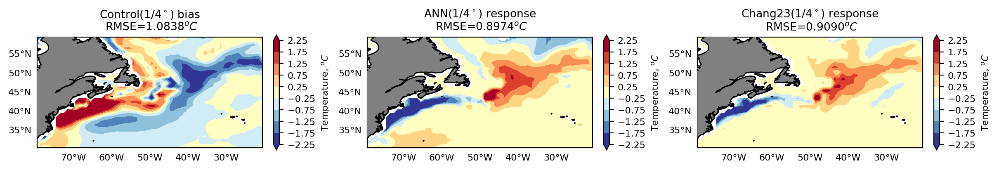

In [48]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', zl=0, select=select_Gulf, ncols=3)
plt.savefig('NA-bias-T.pdf', bbox_inches='tight')

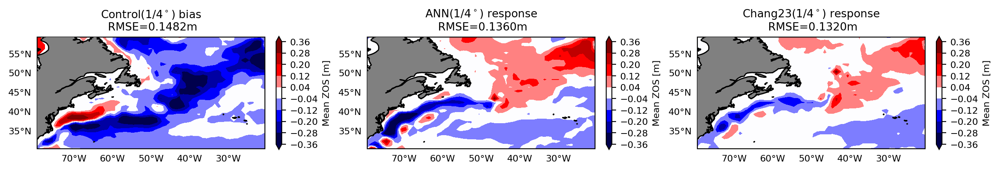

In [49]:
ds.plot_ssh_mean(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', select=select_Gulf, ncols=3)
plt.savefig('NA-bias-H.pdf', bbox_inches='tight')

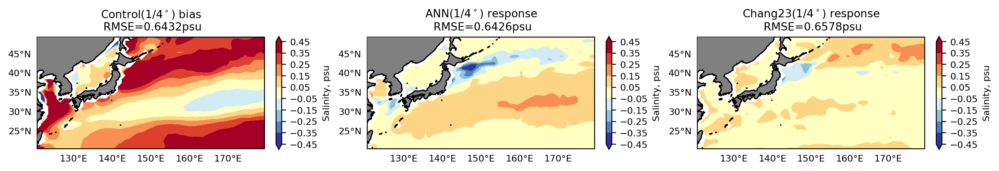

In [43]:
ds.plot_so(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', zl=0, select=select_Kuroshio, ncols=3)
plt.savefig('Kuroshio-bias-S.pdf', bbox_inches='tight')

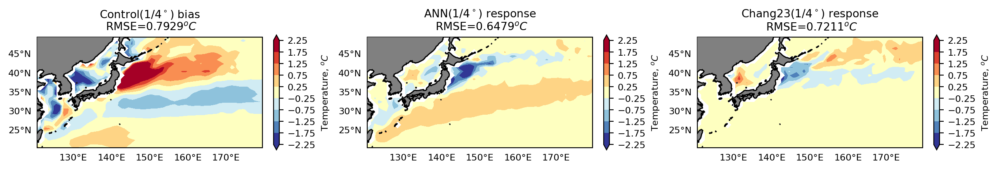

In [44]:
ds.plot_temp(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', zl=0, select=select_Kuroshio, ncols=3)
plt.savefig('Kuroshio-bias-T.pdf', bbox_inches='tight')

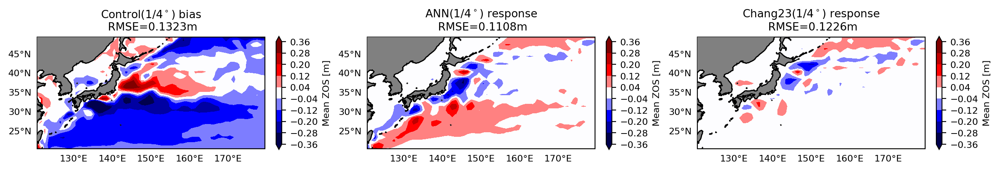

In [45]:
ds.plot_ssh_mean(['unparameterized', 'ANN', 'MEKE-Chang'], labels=['Control($1/4^\circ$)', 'ANN($1/4^\circ$)', 'Chang23($1/4^\circ$)'], plot_type='response', select=select_Kuroshio, ncols=3)
plt.savefig('Kuroshio-bias-H.pdf', bbox_inches='tight')